In [1]:
import oversampling_multiclass
import matplotlib.pyplot as plt
import numpy as np
from resample import resample_dataset
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import exp2

In [2]:
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Adatta questo valore al numero di core che desideri utilizzare

In [3]:
dataset_path = "C:/Users/mario/OneDrive/Desktop/Resample_exp"

# TERZO SET

## SAMPLE RATE 44100

In [5]:
resample_dataset(dataset_path, sr=44100)

File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg1.wav ricampionato a 44100 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg2.wav ricampionato a 44100 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg3.wav ricampionato a 44100 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg4.wav ricampionato a 44100 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg5.wav ricampionato a 44100 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg6.wav ricampionato a 44100 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Deskt

In [6]:
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Adatta questo valore al numero di core che desideri utilizzare

In [7]:
df_4100 = exp2.extract_features_from_directory(dataset_path)

Elaborazione file audio:   0%|          | 101/50993 [00:18<2:23:45,  5.90file/s]C:\Users\mario\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
Elaborazione file audio:  49%|████▉     | 25194/50993 [1:32:04<1:35:30,  4.50file/s]C:\Users\mario\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)
Elaborazione file audio: 100%|██████████| 50993/50993 [19:22:55<00:00,  1.37s/file]   


In [12]:
df_4100.to_csv("resampled_4100_exp3.csv", index=False)

In [13]:
#SPLIT
X_train_imputed_4100, X_val_imputed_4100, X_test_imputed_4100, y_train_encoded_4100, y_val_encoded_4100, y_test_encoded_4100, subclass_encoder_4100 = oversampling_multiclass.split_dataset("resampled_4100_exp3.csv")

In [14]:
#SMOTE
X_train_resampled_4100, y_train_resampled_4100 = oversampling_multiclass.apply_smote_multiclass(X_train_imputed_4100, y_train_encoded_4100, 1)

Distribuzione delle classi nel set di training dopo SMOTE:
0     9181
1     9181
2     9181
3     9181
4     9181
5     9181
6     9181
7     9181
8     9181
9     9181
10    9181
11    9181
12    9181
13    9181
14    9181
15    9181
Name: count, dtype: int64


In [15]:

lightgbm_model_4100 = oversampling_multiclass.train_lightgbm(
    X_train_resampled_4100,
    y_train_resampled_4100,
    X_val_imputed_4100,
    y_val_encoded_4100,
    X_test_imputed_4100,  
    y_test_encoded_4100
)

Report di classificazione del set di validazione:
              precision    recall  f1-score   support

           2       0.90      0.85      0.88       923
           3       0.00      0.00      0.00         3
           5       0.00      1.00      0.00         0
           6       0.71      0.85      0.77      1010
          11       0.00      1.00      0.00         0
          12       0.86      0.71      0.77       911
          13       0.93      0.95      0.94       560
          15       0.67      0.20      0.31        20

    accuracy                           0.82      3427
   macro avg       0.51      0.69      0.46      3427
weighted avg       0.83      0.82      0.82      3427

Accuratezza sul set di validazione: 0.8240
Report di classificazione del set di test:
              precision    recall  f1-score   support

           2       0.68      0.86      0.76      1043
           3       1.00      1.00      1.00         4
           5       0.00      1.00      0.00       

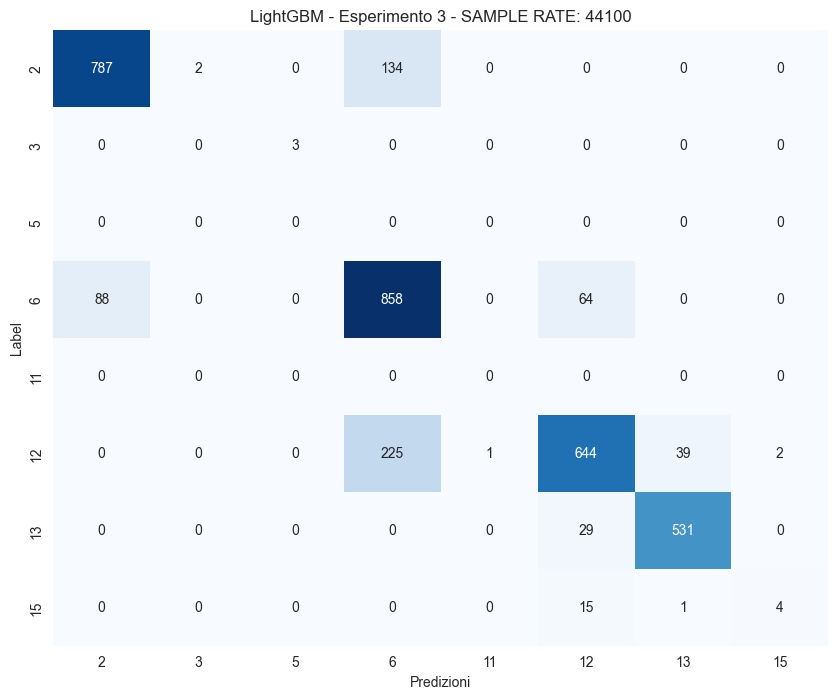

In [19]:
# 1. Effettua le predizioni sul set di convalida (potrebbero essere probabilità per ciascuna classe)
y_pred_proba_lightgbm_4100 = lightgbm_model_4100.predict(X_val_imputed_4100)

# 2. Se LightGBM restituisce probabilità, ottieni le etichette predette con argmax
y_pred_lightgbm_4100 = np.argmax(y_pred_proba_lightgbm_4100, axis=1)

# 3. Filtra solo le classi effettivamente presenti nei dati di validazione e nelle predizioni
class_labels = np.unique(np.concatenate((y_val_encoded_4100, y_pred_lightgbm_4100)))

# 4. Calcola la matrice di confusione solo per le classi presenti
cm_lightgbm_4100 = confusion_matrix(y_val_encoded_4100, y_pred_lightgbm_4100, labels=class_labels)

# 5. Visualizza la matrice di confusione senza griglia
plt.figure(figsize=(10, 8))
sns.heatmap(cm_lightgbm_4100, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_labels, 
            yticklabels=class_labels, 
            cbar=False)  # Disabilita la barra colore se non necessaria

# Rimuove la griglia
plt.grid(False)

# Aggiunge etichette e titolo
plt.xlabel('Predizioni')
plt.ylabel('Label')
plt.title('LightGBM - Esperimento 3 - SAMPLE RATE: 44100')

# Mostra il grafico
plt.show()

## SAMPLE RATE 192000

In [4]:
resample_dataset(dataset_path, sr=192000)

File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg1.wav ricampionato a 192000 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg2.wav ricampionato a 192000 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg3.wav ricampionato a 192000 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg4.wav ricampionato a 192000 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg5.wav ricampionato a 192000 Hz e sovrascritto.
File C:/Users/mario/OneDrive/Desktop/Resample_exp\Non-Target\Ambient Noise\0f9867d8-fcf7-40d1-b846-3f7fb8100eb7_seg6.wav ricampionato a 192000 Hz e sovrascritto.
File C:/Users/mario/OneDrive

In [5]:
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "4"  # Adatta questo valore al numero di core che desideri utilizzare

In [6]:
df_19200 = exp2.extract_features_from_directory(dataset_path)

Elaborazione file audio:   0%|          | 0/50993 [00:00<?, ?file/s]C:\Users\mario\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\feature\spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)
Elaborazione file audio:   0%|          | 101/50993 [03:42<30:04:44,  2.13s/file]C:\Users\mario\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
Elaborazione file audio: 100%|██████████| 50993/50993 [19:26:15<00:00,  1.37s/file]  


In [7]:
df_19200.to_csv("resampled_19200_exp3.csv", index=False)

In [8]:
#SPLIT
X_train_imputed_19200, X_val_imputed_19200, X_test_imputed_19200, y_train_encoded_19200, y_val_encoded_19200, y_test_encoded_19200, subclass_encoder_19200 = oversampling_multiclass.split_dataset("resampled_19200_exp3.csv")

In [9]:
#SMOTE
X_train_resampled_19200, y_train_resampled_19200 = oversampling_multiclass.apply_smote_multiclass(X_train_imputed_19200, y_train_encoded_19200, 1)

Distribuzione delle classi nel set di training dopo SMOTE:
0     9181
1     9181
2     9181
3     9181
4     9181
5     9181
6     9181
7     9181
8     9181
9     9181
10    9181
11    9181
12    9181
13    9181
14    9181
15    9181
Name: count, dtype: int64


In [10]:
lightgbm_model_19200 = oversampling_multiclass.train_lightgbm(
    X_train_resampled_19200,
    y_train_resampled_19200,
    X_val_imputed_19200,
    y_val_encoded_19200,
    X_test_imputed_19200,  
    y_test_encoded_19200
)

Report di classificazione del set di validazione:
              precision    recall  f1-score   support

           2       0.42      0.32      0.36       923
           3       1.00      0.00      0.00         3
           5       0.00      1.00      0.00         0
           6       0.59      0.62      0.60      1010
          12       0.41      0.46      0.43       911
          13       0.46      0.50      0.48       560
          15       0.07      0.10      0.09        20

    accuracy                           0.47      3427
   macro avg       0.42      0.43      0.28      3427
weighted avg       0.47      0.47      0.47      3427

Accuratezza sul set di validazione: 0.4730
Report di classificazione del set di test:
              precision    recall  f1-score   support

           2       0.48      0.61      0.54      1043
           3       0.43      0.75      0.55         4
           6       0.68      0.59      0.63      1871
           7       0.00      1.00      0.00       

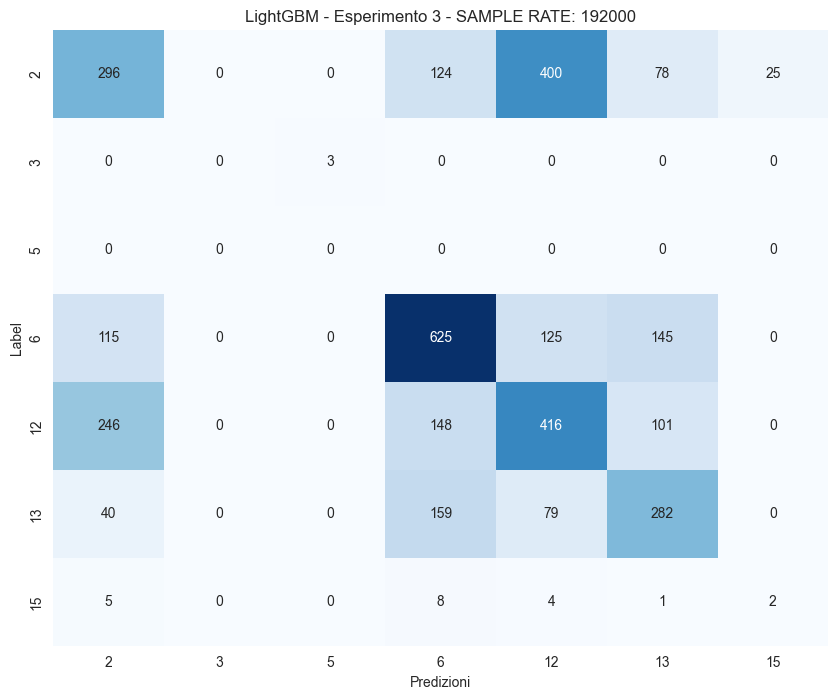

In [11]:
# 1. Effettua le predizioni sul set di convalida (potrebbero essere probabilità per ciascuna classe)
y_pred_proba_lightgbm_19200 = lightgbm_model_19200.predict(X_val_imputed_19200)

# 2. Se LightGBM restituisce probabilità, ottieni le etichette predette con argmax
y_pred_lightgbm_19200 = np.argmax(y_pred_proba_lightgbm_19200, axis=1)

# 3. Filtra solo le classi effettivamente presenti nei dati di validazione e nelle predizioni
class_labels = np.unique(np.concatenate((y_val_encoded_19200, y_pred_lightgbm_19200)))

# 4. Calcola la matrice di confusione solo per le classi presenti
cm_lightgbm_19200 = confusion_matrix(y_val_encoded_19200, y_pred_lightgbm_19200, labels=class_labels)

# 5. Visualizza la matrice di confusione senza griglia
plt.figure(figsize=(10, 8))
sns.heatmap(cm_lightgbm_19200, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_labels, 
            yticklabels=class_labels, 
            cbar=False)  # Disabilita la barra colore se non necessaria

# Rimuove la griglia
plt.grid(False)

# Aggiunge etichette e titolo
plt.xlabel('Predizioni')
plt.ylabel('Label')
plt.title('LightGBM - Esperimento 3 - SAMPLE RATE: 192000')

# Mostra il grafico
plt.show()

## SAMPLE RATE 384000

In [ ]:
resample_dataset(dataset_path, sr=384000)

In [ ]:
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "6"  # Adatta questo valore al numero di core che desideri utilizzare

In [ ]:
df_38400 = exp2.extract_features_from_directory(dataset_path)

In [ ]:
df_38400.to_csv("resampled_38400_exp3.csv", index=False)

In [ ]:
#SPLIT
X_train_imputed_38400, X_val_imputed_38400, X_test_imputed_38400, y_train_encoded_38400, y_val_encoded_38400, y_test_encoded_38400, subclass_encoder_38400 = oversampling_multiclass.split_dataset("resampled_38400_exp3.csv")

In [ ]:
#SMOTE
X_train_resampled_38400, y_train_resampled_38400 = oversampling_multiclass.apply_smote_multiclass(X_train_imputed_38400, y_train_encoded_38400, 1)

In [ ]:
lightgbm_model_38400 = oversampling_multiclass.train_lightgbm(
    X_train_resampled_38400,
    y_train_resampled_38400,
    X_val_imputed_38400,
    y_val_encoded_38400,
    X_test_imputed_38400,  
    y_test_encoded_38400
)


In [ ]:
# 1. Effettua le predizioni sul set di convalida (potrebbero essere probabilità per ciascuna classe)
y_pred_proba_lightgbm_38400 = lightgbm_model_38400.predict(X_val_imputed_38400)

# 2. Se LightGBM restituisce probabilità, ottieni le etichette predette con argmax
y_pred_lightgbm_38400 = np.argmax(y_pred_proba_lightgbm_38400, axis=1)

# 3. Filtra solo le classi effettivamente presenti nei dati di validazione e nelle predizioni
class_labels = np.unique(np.concatenate((y_val_encoded_38400, y_pred_lightgbm_38400)))

# 4. Calcola la matrice di confusione solo per le classi presenti
cm_lightgbm_38400 = confusion_matrix(y_val_encoded_38400, y_pred_lightgbm_38400, labels=class_labels)

# 5. Visualizza la matrice di confusione senza griglia
plt.figure(figsize=(10, 8))
sns.heatmap(cm_lightgbm_38400, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_labels, 
            yticklabels=class_labels, 
            cbar=False)  # Disabilita la barra colore se non necessaria

# Rimuove la griglia
plt.grid(False)

# Aggiunge etichette e titolo
plt.xlabel('Predizioni')
plt.ylabel('Label')
plt.title('LightGBM - Esperimento 3 - SAMPLE RATE: 384000')

# Mostra il grafico
plt.show()